# K-Means Annotator

***

## Motivation:

For my final project, I decided to try and find a use for a K-Means Clustering algorithm. My first thought was to apply it to a situation I encountered in my internship. 

At work, we use a Convolutional Neural Network to detect defects and other information about french fries. The process of annotating images for training is very tedious and time consuming, so I wanted to see if the K-Means algorithm would be able to label similar looking pixels into various classes. This would in theory replace the need to hand annotate the images.


## First Steps: Gathering and Preparing the Data

This part was pretty straightforward since I had easy access to the images I would need to train my model. The biggest thing I had to do for this stage was to figure out how to break down the images into pixels for training.

To do this I decided to use the OpenCV library. I got familiar with this library at my internsip, and it make manipulating images really simple. Another great thing about it is that it plays nicely with numpy.

In [1]:
import numpy as np
import cv2 as cv
from glob import glob
import os
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

At this point I had access to just a bit over 3000 images, which I found out results in a lot of pixels. At least more than my laptop can handle. So I had to sample the original pool of images for a more reasonable data set.

In [2]:
paths = glob(os.path.join(os.getcwd(),"data/*.png"))
split, _ = train_test_split(paths, test_size=.975, random_state=42)
train, test = train_test_split(split, test_size=.25, random_state=42)
len(train)

56

In [3]:
train_set = []
test_set = []
for p in train:
    train_set.append(cv.imread(p))
for p in test:
    test_set.append(cv.imread(p))
len(train_set)

56

In [4]:
pixels = []
for img in train_set:
    rows,cols,_ = img.shape
    for i in range(rows):
        for j in range(cols):
            pixels.append(img[i,j])
len(pixels)

44040192

As a part of preparing the data, I wrote these helpful functions for transforming a three channel image to an array of pixels and back.

In [5]:
def prepImg(img, img_size):
    return img.reshape(img_size[0] * img_size[1], img_size[2])

def extractImg(model_output, img_size):
    img = model_output.reshape(img_size[0], img_size[1])
    return img

## Training the model

This probably took the longest out of any of the steps in working through the design of this model. When you get in to training with a lot of data it takes some time. I wanted to try a couple different number of clusters.

In [13]:
models = {}
for i in range(1,10):
    model = KMeans(n_clusters=i)
    model.fit(pixels)
    models[i] = model

In [7]:
def predict(model, img):
    img_size = img.shape
    input_img = prepImg(img, img_size)
    output = model.predict(input_img)
    return extractImg(output, img_size)

In [8]:
def display_pred(orig, model_output, i):
    fig, ax = plt.subplots(1,2, figsize=(32,16))
    plt_img = cv.cvtColor(orig, cv.COLOR_BGR2RGB)
    ax[0].imshow(plt_img)
    ax[0].set_title("Original")
    ax[1].imshow(model_output)
    ax[1].set_title("Model Output:Clusters:{}".format(i))

## Analyzing the Results

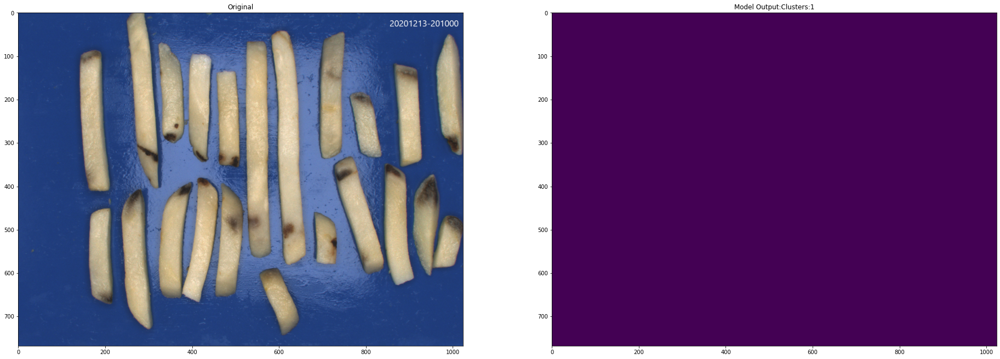

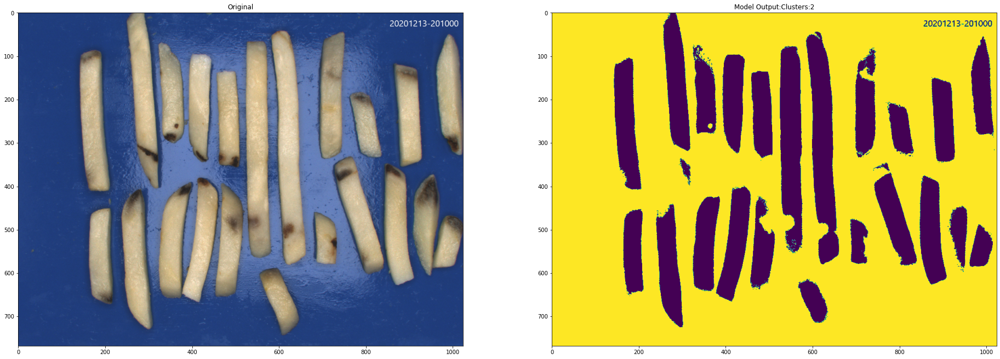

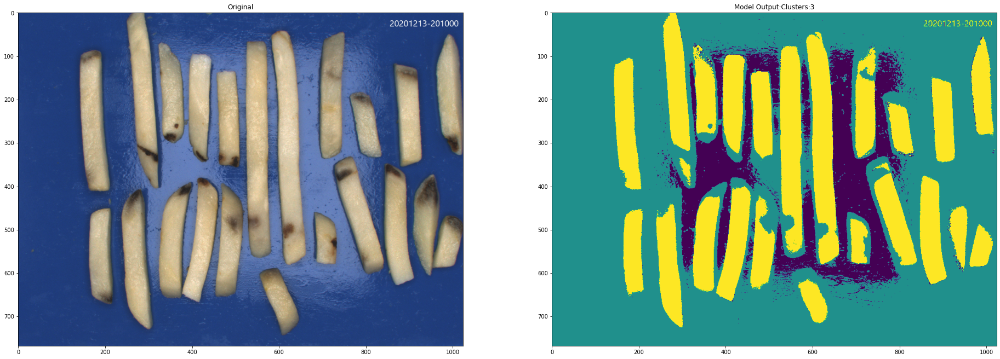

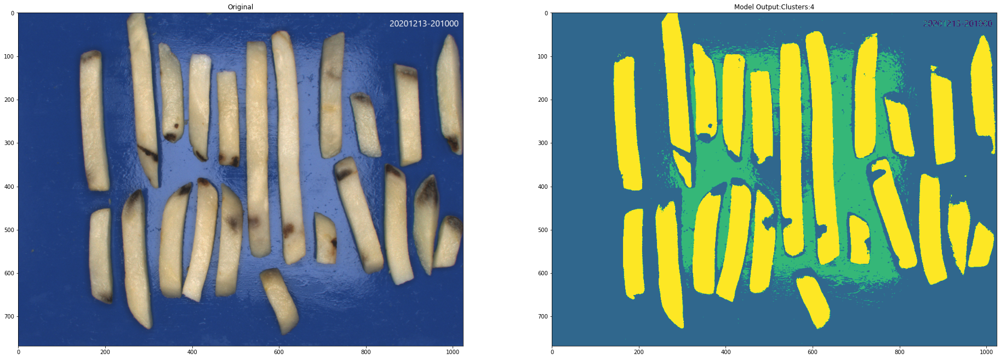

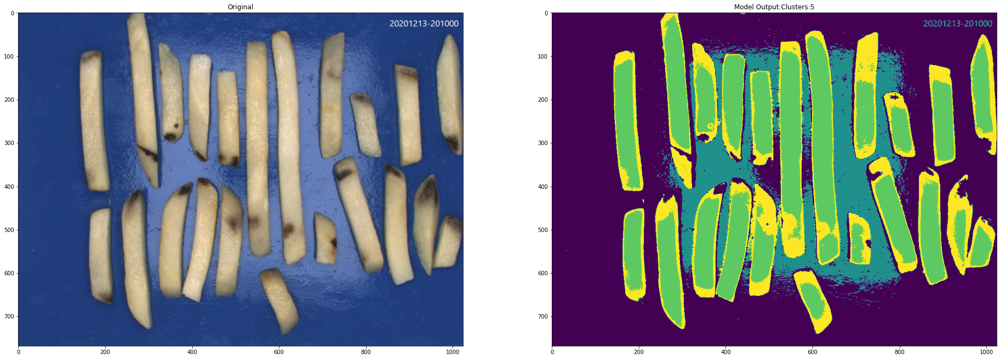

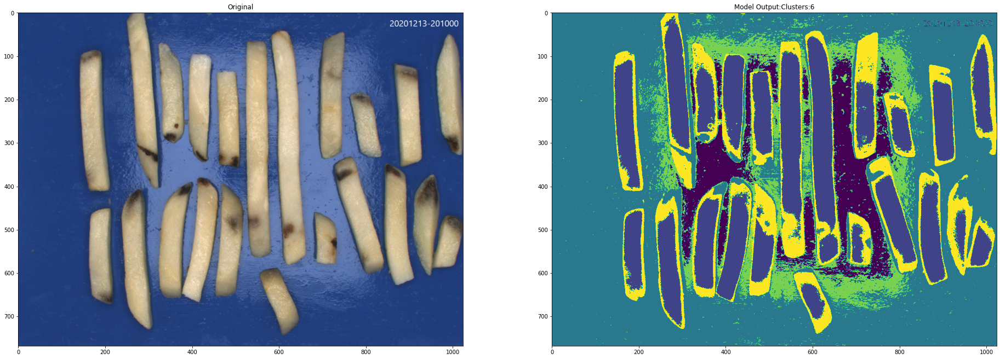

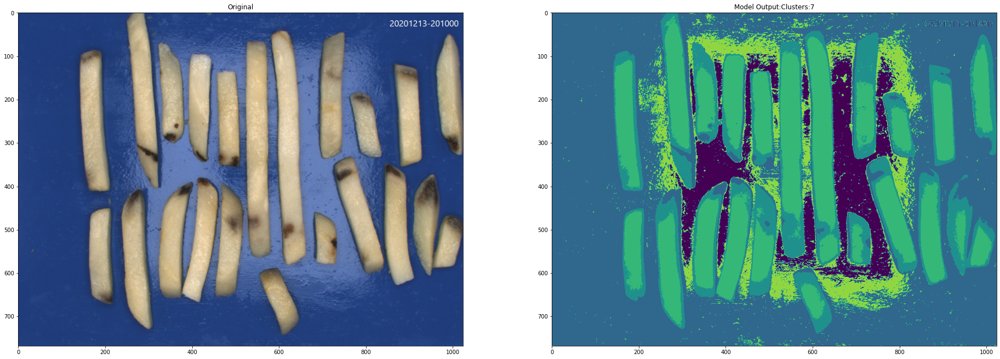

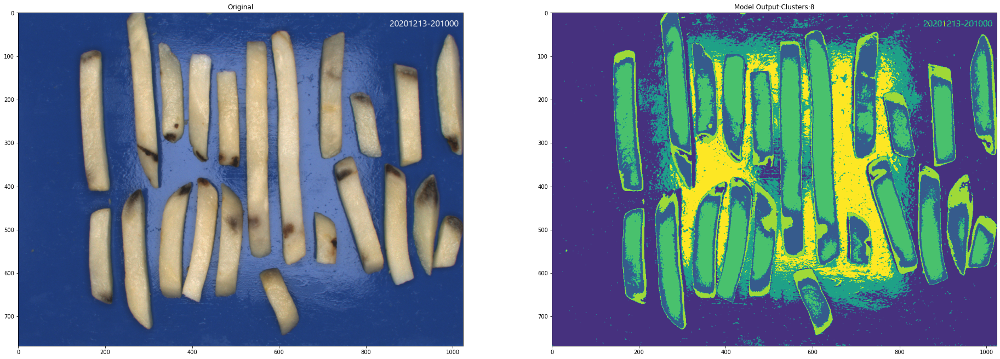

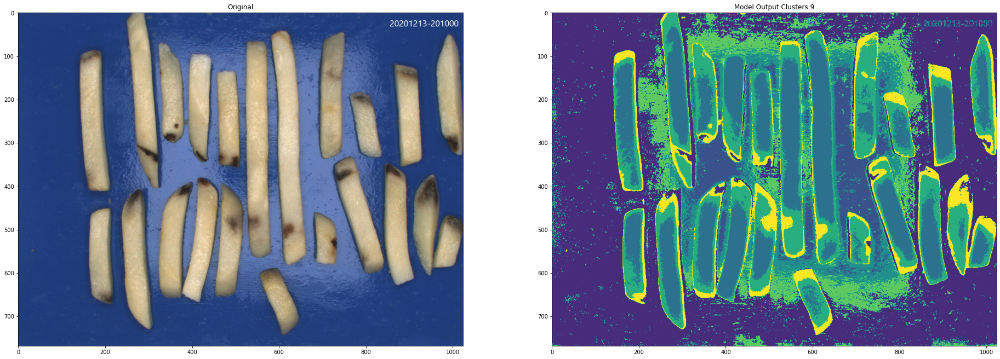

In [14]:
for i in range(1,10):
    in_img = test_set[3]
    out = predict(models[i], in_img)
    display_pred(in_img,out,i)

## Conclusion

I was honestly a bit surprised by the results of this experiment. I didn't have super high hopes of it producing high quality results, but it actually did fairly well.

One of the things that really surprised me was how it grouped certain pixels together at different levels. Just looking at these images I had different expectations of how certain pixels would be grouped.

The most accurate number of clusters appears to be when k=4. When you go higher than that it looks like the clusters begin to associate certain parts on the fry with parts of the background.

As a final conclusion, I am not quite sure that this would work for the application I was originally hoping for. Labeled images need to be very precise and do not allow for some of the errors I saw in the output of the K-Means Clustering algorithm.